Problem 1 - Open ended analysis of letter recognition dataset

In [4]:
# Imports 
from sklearn.decomposition import PCA

from sklearn.preprocessing import StandardScaler

from sklearn.datasets import load_boston,load_iris

%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sbn
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import math

In [56]:
# Load in the data
# Note - this file has been modified to have feature names in first row for easier loading with names
letters = pd.read_csv("data/letter-recognition.data")

# Split data into x and y sets 
x = letters.drop("lettr", axis=1)
y = letters["lettr"]

# Display a few examples of rows.
letters.head(3)

,lettr,x-box,y-box,width,high,onpix,x-bar,y-bar,x2bar,y2bar,xybar,x2ybr,xy2br,x-ege,xegvy,y-ege,yegvx
0,T,2,8,3,5,1,8,13,0,6,6,10,8,0,8,0,8
1,I,5,12,3,7,2,10,5,5,4,13,3,9,2,8,4,10
2,D,4,11,6,8,6,10,6,2,6,10,3,7,3,7,3,9


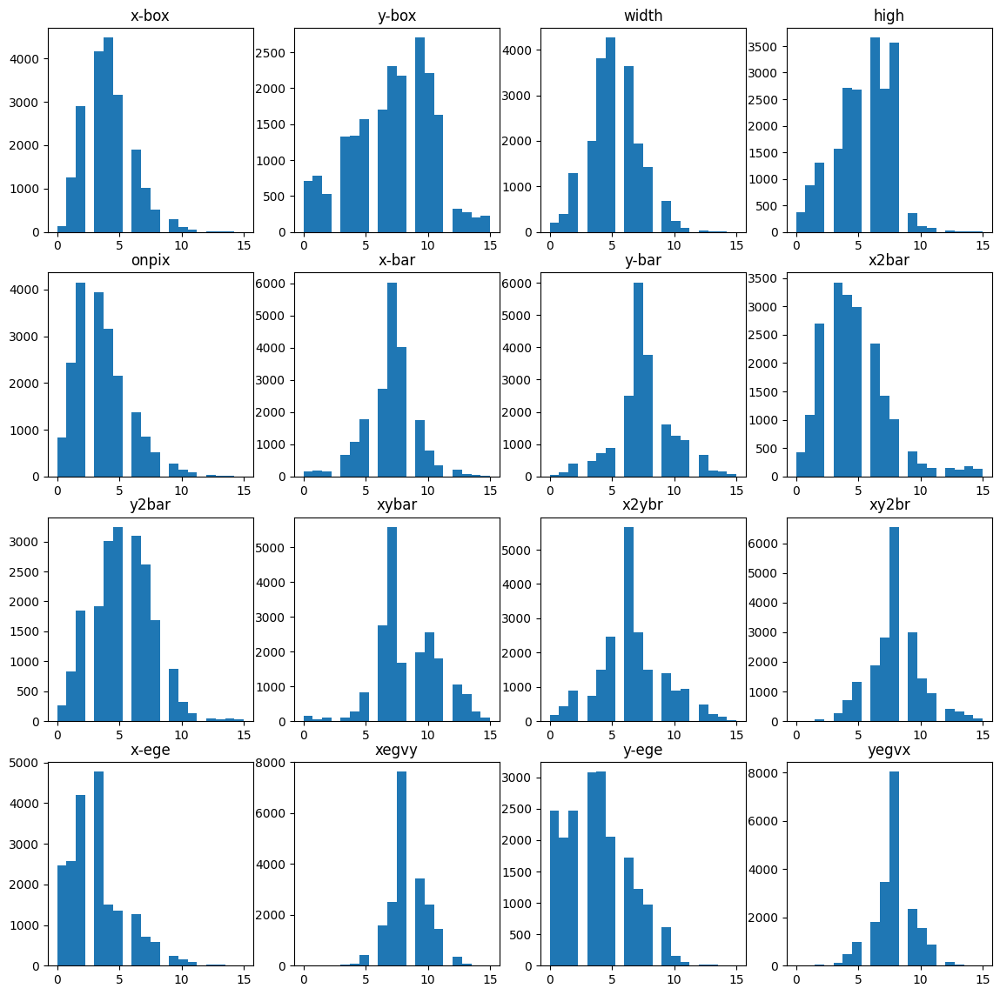

In [57]:
# Display feature histograms 
fig, axs = plt.subplots(4, 4, sharey=False, sharex=False, figsize=(14,14))
for i in range(4):
    for j in range(4):
        axs[i][j].hist(x[x.columns[i*4+j]], bins=20)
        axs[i][j].set_title(str(x.columns[i*4+j]))

<AxesSubplot: >

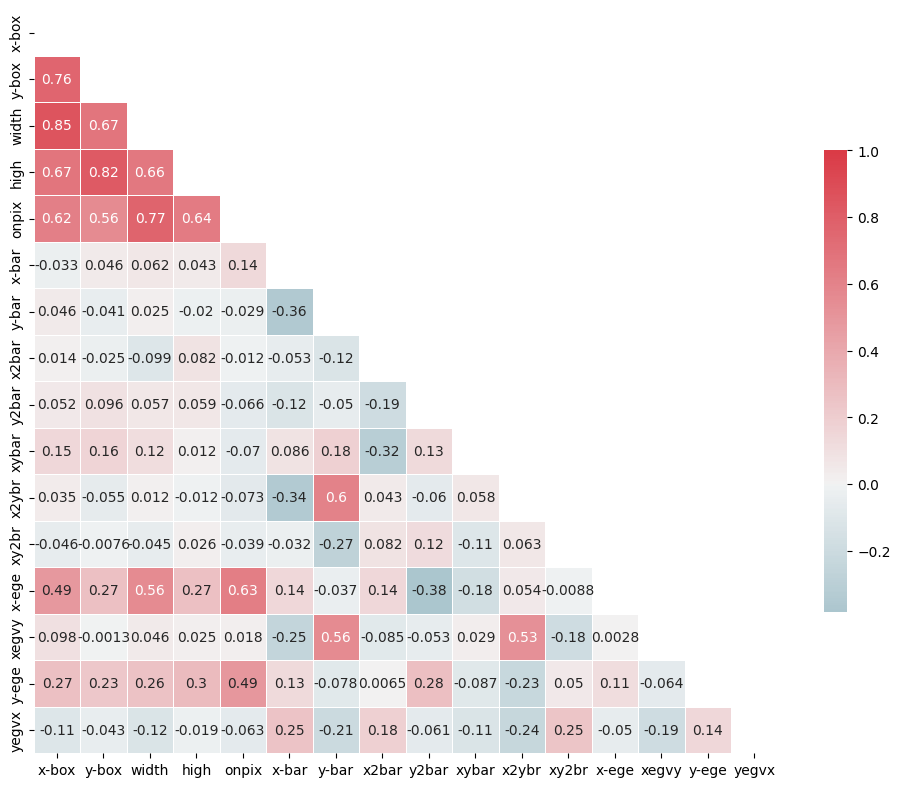

In [58]:
# Calculate correlations and display correlation heatmap - based on NB6
import seaborn as sbn
letter_corr = x.corr()
corr = letter_corr.values
mask = np.zeros_like(corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True
f, ax = plt.subplots(figsize=(12, 12))
cmap = sbn.diverging_palette(220, 10, as_cmap=True)
sbn.heatmap(letter_corr, mask=mask, cmap=cmap, vmax=1.0,annot=True, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

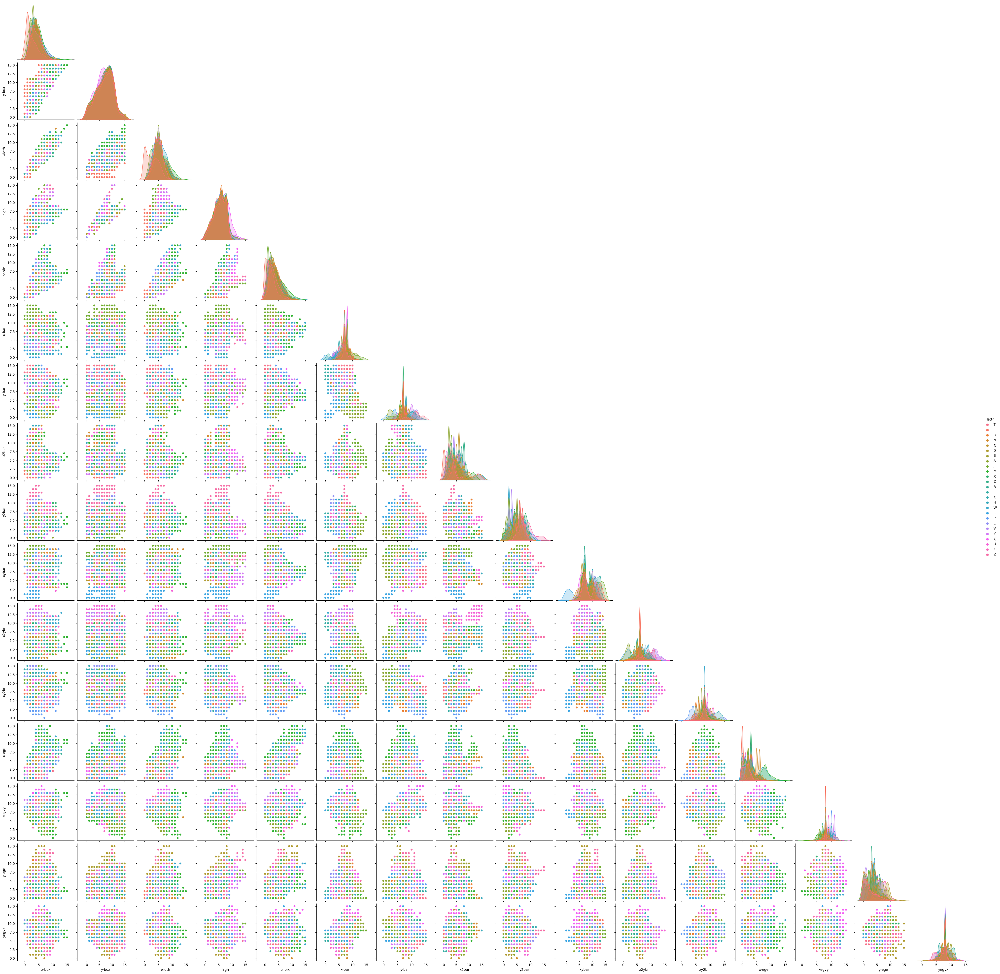

In [59]:
# Display a pairplot
vars = ["x-box","y-box","width","high","onpix","x-bar","y-bar","x2bar","y2bar","xybar","x2ybr","xy2br","x-ege","xegvy","y-ege","yegvx"]

sbn.pairplot(
    letters, 
    hue="lettr",  
    height=2.5, 
    corner=True,
    x_vars=x,
    y_vars=x,
)

In [60]:
# Calculate and print covariance matrix
X = x.values
Y = y.values
np.set_printoptions(precision=2, suppress=True, linewidth=150)
sigmaX = np.std(X,axis=0)
# X = X/sigmaX # If Correlation PCA is required
muX = np.mean(X, axis=0)
n = X.shape[0]
print("The size of data set is:", n)
S = np.dot((X - muX).T, (X - muX)) / (n-1)
print('Covariance matrix: \n:')
print(S)

The size of data set is: 20000
Covariance matrix: 
:
[[ 3.66  4.79  3.28  2.91  2.59 -0.13  0.2   0.07  0.24  0.7   0.18 -0.18  2.18  0.29  1.34 -0.33]
 [ 4.79 10.92  4.47  6.15  4.02  0.31 -0.31 -0.22  0.76  1.32 -0.48 -0.05  2.12 -0.01  1.96 -0.23]
 [ 3.28  4.47  4.06  3.01  3.38  0.25  0.12 -0.54  0.27  0.58  0.06 -0.19  2.62  0.14  1.35 -0.39]
 [ 2.91  6.15  3.01  5.11  3.19  0.2  -0.11  0.5   0.32  0.07 -0.07  0.12  1.4   0.09  1.73 -0.07]
 [ 2.59  4.02  3.38  3.19  4.8   0.62 -0.15 -0.07 -0.34 -0.38 -0.42 -0.18  3.21  0.06  2.77 -0.22]
 [-0.13  0.31  0.25  0.2   0.62  4.1  -1.68 -0.29 -0.59  0.43 -1.82 -0.14  0.68 -0.79  0.66  0.82]
 [ 0.2  -0.31  0.12 -0.11 -0.15 -1.68  5.41 -0.74 -0.27  1.03  3.67 -1.31 -0.2   2.   -0.47 -0.78]
 [ 0.07 -0.22 -0.54  0.5  -0.07 -0.29 -0.74  7.29 -1.21 -2.14  0.3   0.46  0.9  -0.35  0.05  0.8 ]
 [ 0.24  0.76  0.27  0.32 -0.34 -0.59 -0.27 -1.21  5.67  0.78 -0.38  0.59 -2.13 -0.19  1.7  -0.24]
 [ 0.7   1.32  0.58  0.07 -0.38  0.43  1.03 -2.14  0.78 

In [61]:
# Eigenvalue Decomposition of S
w, v = np.linalg.eig(S)

#print('Eigenvectors \n%s' %v)
print('\nEigenvalues \n%s' %w)
print('\n Explained Ratio: \n%s' %(w/np.sum(w)))


Eigenvalues 
[24.52 12.88 10.69  7.48  6.5   4.8   4.34  3.36  0.31  2.69  2.02  0.69  1.06  1.5   1.37  1.28]

 Explained Ratio: 
[0.29 0.15 0.13 0.09 0.08 0.06 0.05 0.04 0.   0.03 0.02 0.01 0.01 0.02 0.02 0.01]


In [62]:
# SVD
U,s,V = np.linalg.svd(X-muX)
s2 = s**2;
print('\n Singularvalues \n%s' %s)
print('\n Singularvalues *(n-1) \n {}'.format(s**2/(n-1)))
print('\n Explained Ratio: \n%s' %(s2/np.sum(s2)))
# Note this is actually sorted. Not sure why above isn't.


 Singularvalues 
[700.26 507.62 462.45 386.84 360.54 309.83 294.63 259.17 232.1  201.16 173.24 165.75 159.71 145.59 117.24  78.97]

 Singularvalues *(n-1) 
 [24.52 12.88 10.69  7.48  6.5   4.8   4.34  3.36  2.69  2.02  1.5   1.37  1.28  1.06  0.69  0.31]

 Explained Ratio: 
[0.29 0.15 0.13 0.09 0.08 0.06 0.05 0.04 0.03 0.02 0.02 0.02 0.01 0.01 0.01 0.  ]


In [63]:
# Run PCA 
# Instantiate PCA
# Chose 6 because there are double number of singular values as 
# example, so double the 3 components chosen in the example
pca = PCA(n_components=6)
pca.fit((X-muX).T) # Features are the rows in Standard PCA by convention, so we transform

Xpca = pca.transform(X.T)
#print("PCA components: %s") # pca.explained_variance_
#print(pca.components_)
print("Explained Variance Ratio")
print(pca.explained_variance_ratio_)
print("Components")
print(pca.components_)
print("Explained Variance")
print(pca.explained_variance_)

Explained Variance Ratio
[0.24 0.16 0.15 0.1  0.09 0.07]
Components
[[-0.01  0.01  0.01 ... -0.   -0.01  0.01]
 [-0.01  0.   -0.   ... -0.02  0.    0.  ]
 [ 0.    0.01  0.01 ...  0.    0.01  0.  ]
 [-0.    0.01  0.01 ... -0.    0.01  0.01]
 [-0.   -0.02 -0.   ...  0.    0.   -0.01]
 [ 0.01 -0.01 -0.   ... -0.01  0.   -0.  ]]
Explained Variance
[22888.25 15873.76 14080.44  9273.28  8625.48  6398.07]


In [64]:
# Run correlation PCA
pca_corr = PCA(n_components=6)
muX = np.mean(X, axis=0)
sigmaX = np.std(X,axis=0)
Xn = (X-muX)/sigmaX # One can use the StandardScalar available with ScikitLearn
pca_corr.fit(Xn.T) # Features are the rows, so we transform
Xpca_corr = pca_corr.transform(Xn.T)
print ("Explained Variance Ratio")
print (pca_corr.explained_variance_ratio_)

Explained Variance Ratio
[0.22 0.18 0.13 0.09 0.08 0.07]


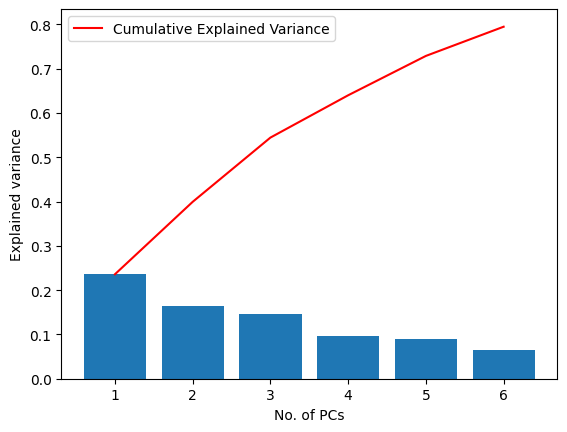

In [65]:
# Scree plot on normal PCA
plt.bar(range(1,len(pca.explained_variance_ratio_ )+1),pca.explained_variance_ratio_ )
plt.ylabel('Explained variance')
plt.xlabel('No. of PCs')
plt.plot(range(1,len(pca.explained_variance_ratio_ )+1),
         np.cumsum(pca.explained_variance_ratio_),
         c='red',
         label="Cumulative Explained Variance")
plt.legend(loc='upper left')

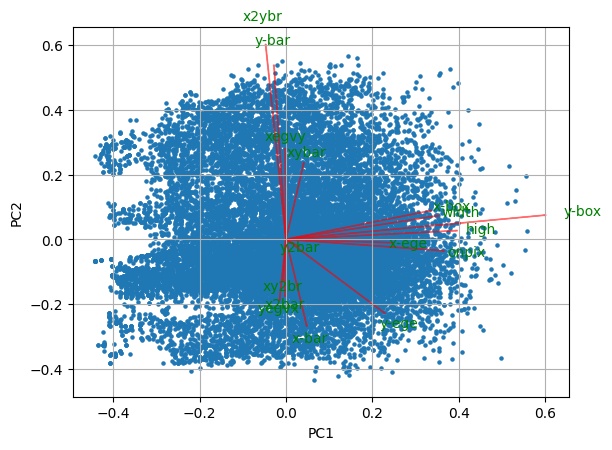

In [66]:
# Biplot - code from NB6
def myplot(score,coeff,labels=None):
    xs = score[:,0]
    ys = score[:,1]
    n = coeff.shape[0]
    scalex = 1.0/(xs.max() - xs.min())
    scaley = 1.0/(ys.max() - ys.min())
    plt.scatter(xs * scalex,ys * scaley,s=5)
    for i in range(n):
        plt.arrow(0, 0, coeff[i,0], coeff[i,1],color = 'r',alpha = 0.5)
        if labels is None:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, "Var"+str(i+1), color = 'green', ha = 'center', va = 'center')
        else:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, labels[i], color = 'g', ha = 'center', va = 'center')
 
    plt.xlabel("PC{}".format(1))
    plt.ylabel("PC{}".format(2))
    plt.grid()

myplot(pca.fit_transform(X)[:,0:2],np.transpose(pca.components_[0:2, :]),vars)
plt.show()

Final discussion of problem 1: A few of the features are strongly correlated, while the rest are mostly uncorrelated. SVD reveals that the singular values are more spread out over the smaller singular values, while there a few large singular values. 6 out of the 16 principal components account for about 80% of the dataset's variance. This data isn't really that close to being low-rank, but it does have some important principal components. I decided to forego displaying a histogram for every classification-feature pair because that would result in 26*16 = 416 plots, which would make this document longer than it already is. 

Problem 2<br>

Countries chosen + reason<br>
1: Costa Rica - Same columns; assuming low rank<br>
2: Eritrea - Angled, so no same columns; wondering about effect on rank<br>
3: Grenada - Some same columns but complex in center<br>
4: Italy - Same rows - know rank = col rank = row rank. Maybe low rank?<br>
5: italy - some complex, some identical columns.

In [5]:
# Implements image compression based on NB5
# Implements as class so we can keep information (like rank) 
# and dont have to copy code for each image 

def display_image(arr_image,color_map=None,dim=(10,20)):
    arr_image = arr_image/np.max(arr_image)
    arr_image = np.uint8(arr_image*255)
    plt.figure(figsize=dim)
    plt.axis('off')
    plt.imshow(arr_image, cmap=color_map)
    plt.show()
    
# convenience
U = "U"
S = "S"
V = "V"

r = 0
g = 1
b = 2

class ImageCompressor:
    def __init__(self, path):
        pic = mpimg.imread(path)
        self.pic = pic / 255
        # Calculate SVD
        U0, S0, V0 = np.linalg.svd(self.pic[...,0])
        U1, S1, V1 = np.linalg.svd(self.pic[...,1])
        U2, S2, V2 = np.linalg.svd(self.pic[...,2])
        self.svd_info = {U: [U0, U1, U2],
                         S: [S0, S1, S2],
                         V: [V0, V1, V2]}
        self.compressed = None
        self.name = None
    # print the 8 greatest singular values of given channel
    def print_singular_values(self, channel):
        clrs = ["red", "green", "blue"]
        print(f"Here are the highest 8 singular values for the {clrs[channel]} channel: \n{self.svd_info[S][channel][:8]}")
    
    # rank of flag = smallest rank out of each channel
    def flag_rank(self, eps = 1e-10):
        # Assignment says epsilon but i guess minor image noise
        # is bringing every flag to full rank at that epsilon.
        # So, I've chosen an epsilon a few magnitudes greater
        r1 = np.count_nonzero(self.svd_info[S][0] > eps)
        r2 = np.count_nonzero(self.svd_info[S][1] > eps)
        r3 = np.count_nonzero(self.svd_info[S][2] > eps)
        return min((r1, r2, r3))
    
    # Compress image
    def compress(self, k=50):
        cr = np.dot(self.svd_info[U][0][:,:k], self.svd_info[V][0][:k,:] * self.svd_info[S][0][:k].reshape(k,1))
        cg = np.dot(self.svd_info[U][1][:,:k], self.svd_info[V][1][:k,:] * self.svd_info[S][1][:k].reshape(k,1))
        cb = np.dot(self.svd_info[U][2][:,:k], self.svd_info[V][2][:k,:] * self.svd_info[S][2][:k].reshape(k,1))
        self.compressed = np.zeros_like(self.pic)
        self.compressed[:,:,0] = cr * 255
        self.compressed[:,:,1] = cg * 255
        self.compressed[:,:,2] = cb * 255
        if self.compressed.shape[2] == 4:
            self.compressed[:,:,3] = 255

    # Display image
    def display(self):
        display_image(self.pic * 255, dim=(20,20))
    
    # Display compressed image
    def display_compressed(self):
        if(self.compressed is None):
            print("Please run compress() first")
            return
        display_image(self.compressed, dim=(20,20))
        
def calc_and_display_flag(name, compratio = 4):
    country = ImageCompressor(f"data/{name}.jpg")
    country.name = name
    print(f"Compressing flag of {name}")
    print(country.flag_rank())
    country.print_singular_values(r)
    country.print_singular_values(g)
    country.print_singular_values(b)
    country.display()
    # Compress based on rank
    k = k=math.ceil(country.flag_rank() / float(compratio))
    country.compress(k)
    print(f"Compression to k = {100 / float(compratio)}% of rank")
    country.display_compressed()
    # return for sorting rank later
    return country
    

Compressing flag of costarica
116
Here are the highest 8 singular values for the red channel: 
[388.16140343  26.60282248  11.64247472   5.94592847   5.25496302
   4.71379099   3.25159514   3.06863855]
Here are the highest 8 singular values for the green channel: 
[311.01045232  54.5870462   22.67100422  18.25465977  10.36741313
   6.76081543   5.87580313   4.78681742]
Here are the highest 8 singular values for the blue channel: 
[345.46483454  44.95000895  20.1257663   19.75714893  12.5368253
   8.39958315   6.93728023   4.88348107]


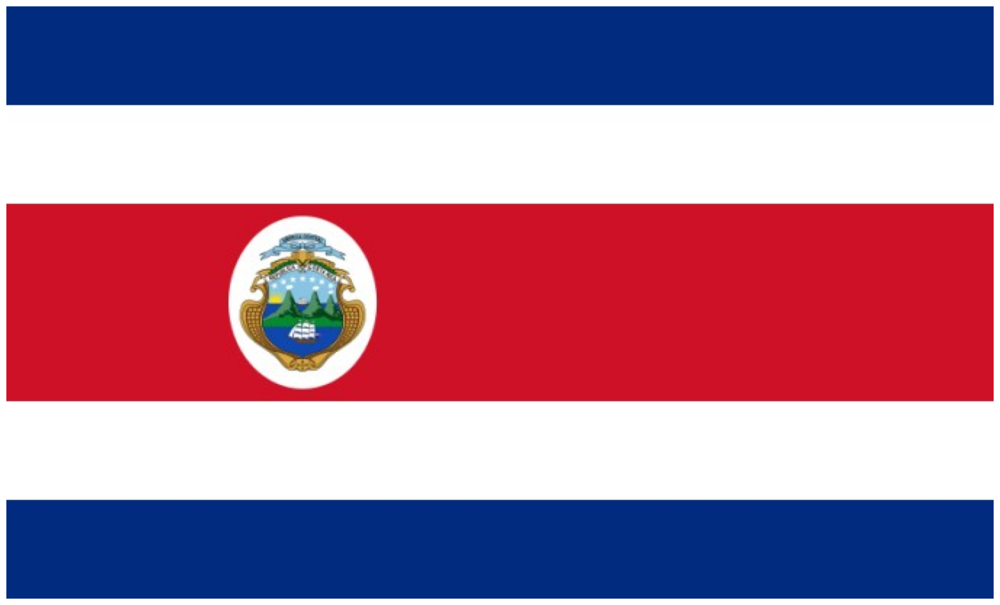

Compression to k = 25.0% of rank


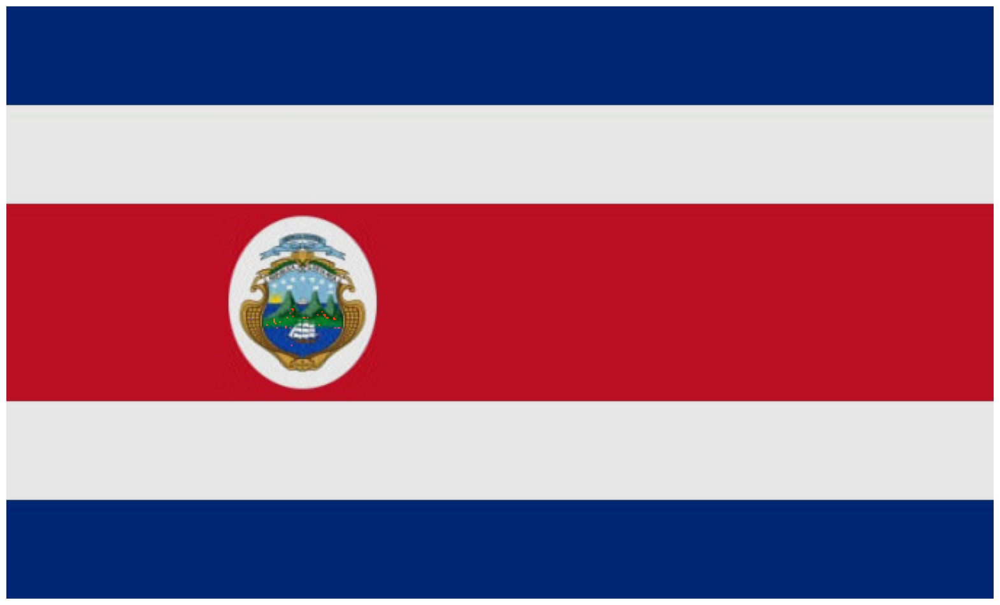

Compressing flag of eritrea
341
Here are the highest 8 singular values for the red channel: 
[302.17127732  73.73939251  49.82082074  32.78063466  26.7417219
  21.17154126  18.43701059  15.50952517]
Here are the highest 8 singular values for the green channel: 
[198.257954    65.18864171  45.13000752  35.40933258  32.28710813
  21.96217371  20.87523979  19.02609548]
Here are the highest 8 singular values for the blue channel: 
[212.71943168  46.77030642  30.51822079  20.64229054  17.2281781
  13.28983405  11.55707979   9.65330893]


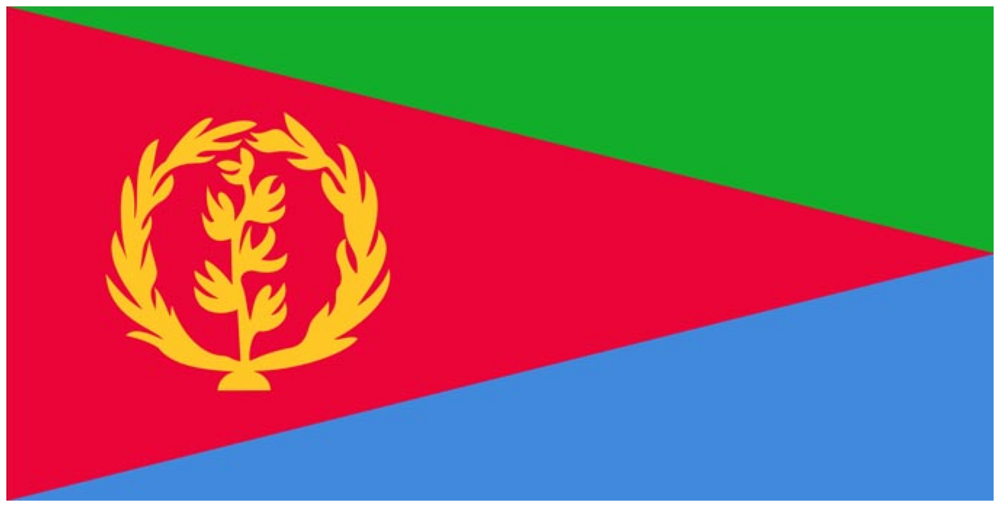

Compression to k = 25.0% of rank


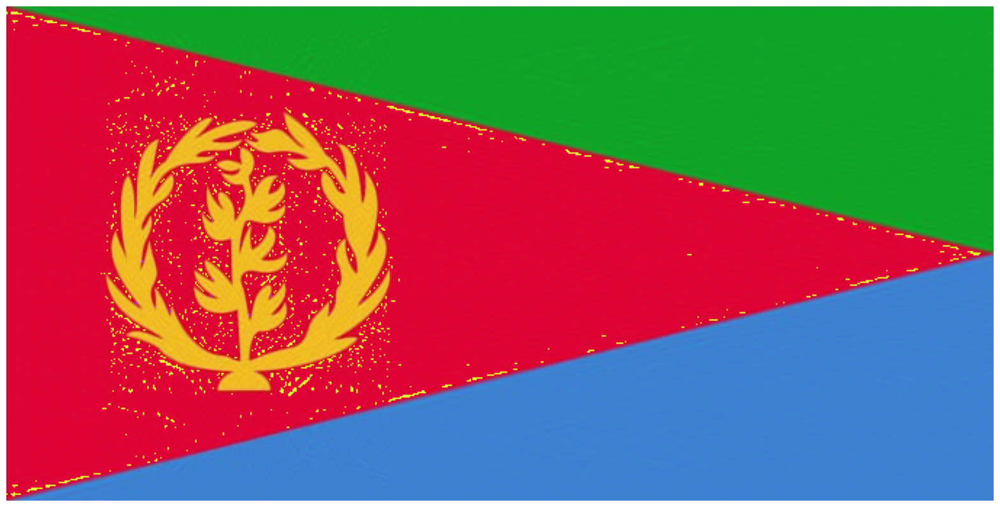

Compressing flag of grenada
404
Here are the highest 8 singular values for the red channel: 
[364.22809362 107.47770948  80.70114212  42.19224514  34.59696247
  28.54389661  19.49581596  18.37496414]
Here are the highest 8 singular values for the green channel: 
[266.30649026  42.02725246  32.10534791  23.34217234  18.98458612
  16.32423482  14.31590743  12.76104713]
Here are the highest 8 singular values for the blue channel: 
[111.51950435  25.87250443  17.64182771  10.3544958    9.87554328
   8.36354297   5.5532941    5.21372105]


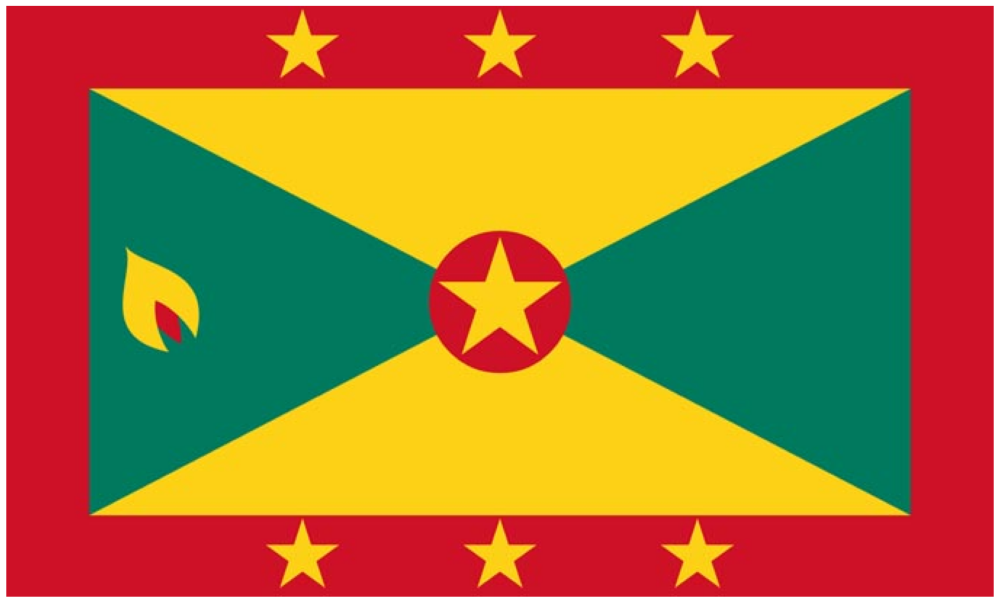

Compression to k = 25.0% of rank


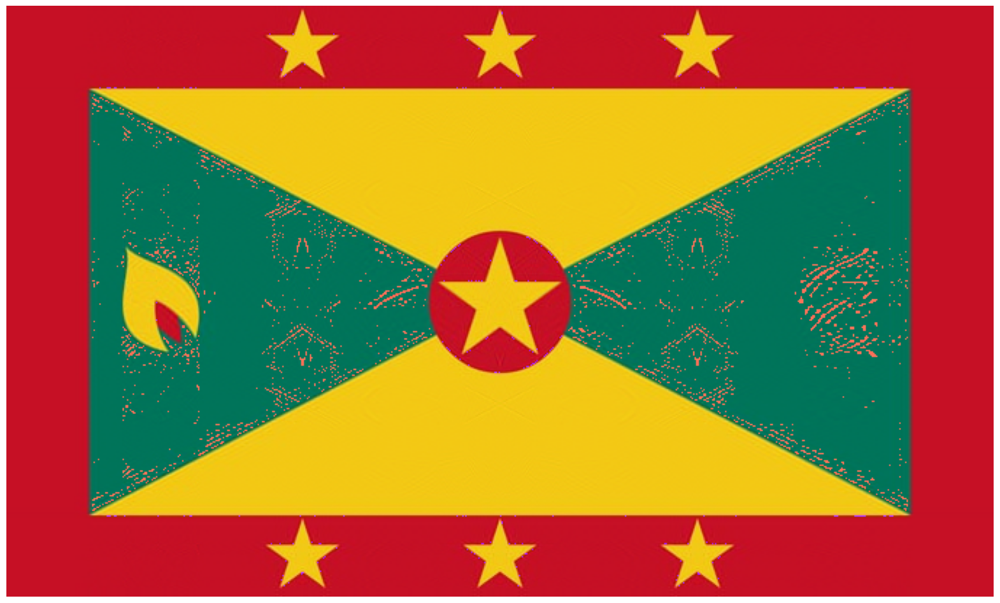

Compressing flag of italy
1
Here are the highest 8 singular values for the red channel: 
[4.12401194e+02 4.03060010e-12 3.72599106e-12 2.81714605e-12
 2.23651709e-12 2.09797407e-12 2.08091911e-12 1.87476592e-12]
Here are the highest 8 singular values for the green channel: 
[3.73019923e+02 7.48995815e-12 3.71229913e-12 3.30655118e-12
 2.75785863e-12 2.55397663e-12 2.13575829e-12 2.02322197e-12]
Here are the highest 8 singular values for the blue channel: 
[3.39311652e+02 7.45943948e-12 3.19584686e-12 2.41886487e-12
 1.96831867e-12 1.94318797e-12 1.71576389e-12 1.55031752e-12]


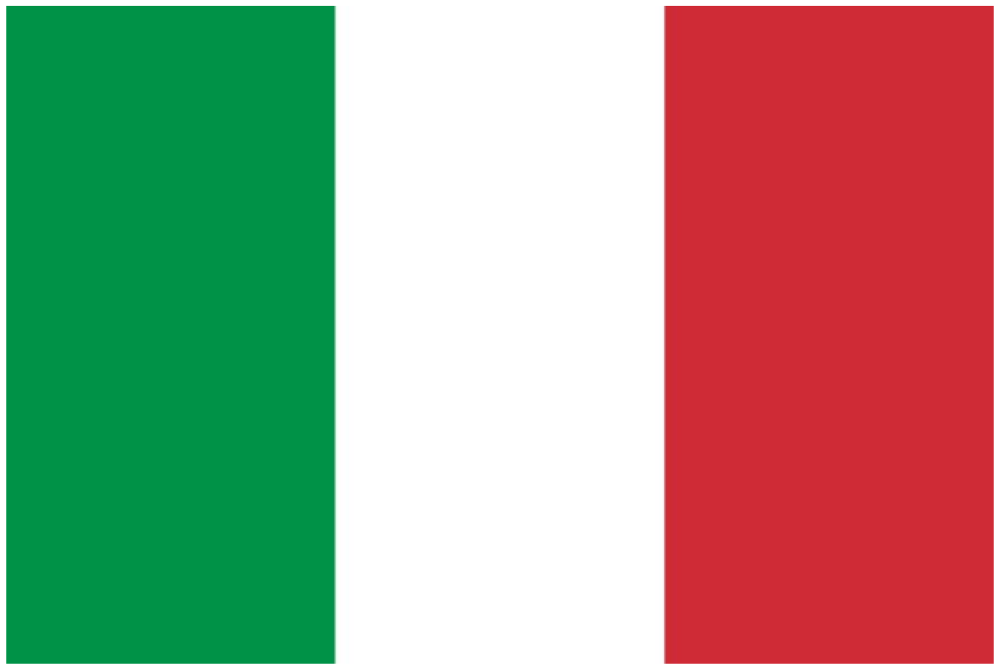

Compression to k = 25.0% of rank


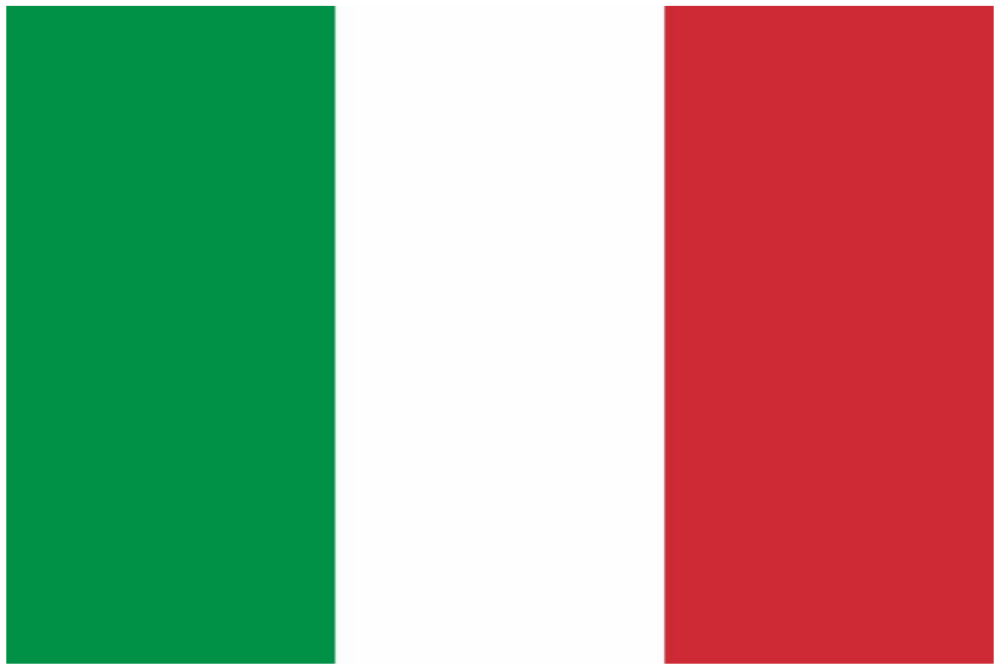

Compressing flag of usa
191
Here are the highest 8 singular values for the red channel: 
[373.59328009  74.2590832   37.16514131  16.98386987  13.72736032
  11.27318429  10.20990362   7.6690859 ]
Here are the highest 8 singular values for the green channel: 
[301.24924846  73.02017042  36.26682372  21.196283    14.06072711
  11.65991239  10.41512957   8.08166584]
Here are the highest 8 singular values for the blue channel: 
[318.46643805  66.56106524  26.49260704  15.35522654  11.54705377
   9.55372316   8.65497482   6.84819545]


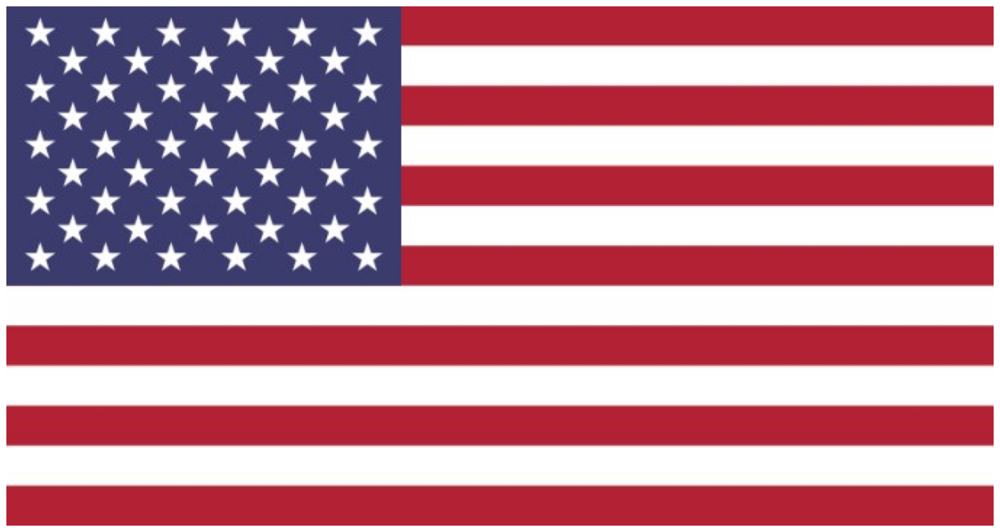

Compression to k = 25.0% of rank


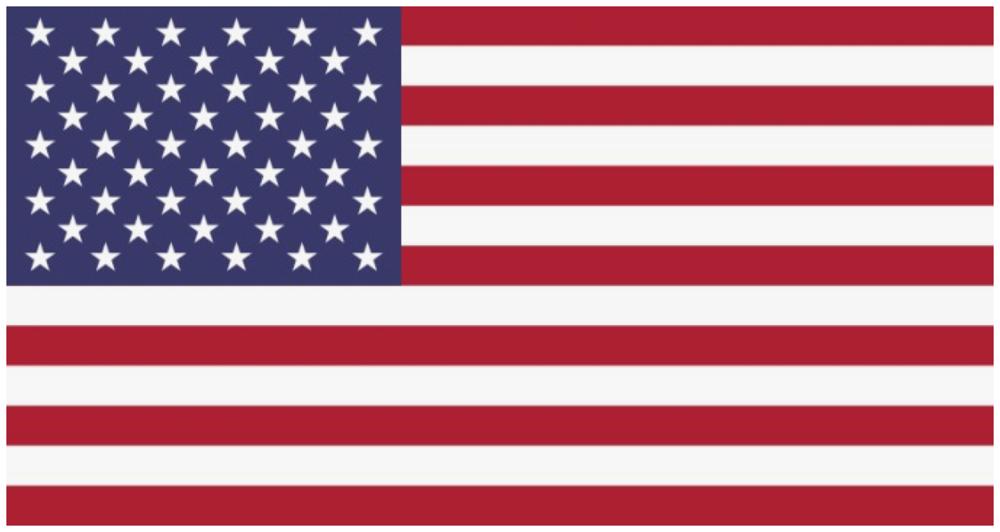

In [9]:
ratio = 4
cos = calc_and_display_flag("costarica", ratio)
eri = calc_and_display_flag("eritrea", ratio)
gre = calc_and_display_flag("grenada", ratio)
ita = calc_and_display_flag("italy", ratio)
usa = calc_and_display_flag("usa", ratio)

In [11]:
countries = [cos, eri, gre, ita, usa]
countries = sorted(countries, key=lambda c : c.flag_rank(), reverse=True) 
{c.name: c.flag_rank() for c in countries}

{'grenada': 404, 'eritrea': 341, 'usa': 191, 'costarica': 116, 'italy': 1}

Observations: Higher ranked flags compress with many artifacts - a normal effect for fixed-ratio compression. These flags require a higher k for compression that looks the same to the human eye as the original flag. Low rank flags do not need as many of their singular values. 